# W207 Final Project – San Francisco Crime Classification
### By: Daghan, Jerry, and PJ

Import libraries to facilitate data acquisition & processing, data exploration & visualization, feature engineering, and machine learning experimentation.

In [1]:
%matplotlib inline

# Visualization
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns

# Data Structure
import numpy as np
import scipy as sp
import pandas as pd

# Machine Learning
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.linear_model import LogisticRegression, Perceptron, SGDClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.metrics import log_loss
from sklearn.feature_selection import SelectFromModel, VarianceThreshold
from sklearn.pipeline import FeatureUnion, Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.svm import SVC

# Others
from datetime import datetime
import re
import zipfile
import os.path
import random

### Define Helper Functions

In [2]:
def print_full(statement):
    pd.set_option('display.max_rows', len(statement))
    print(statement)
    pd.reset_option('display.max_rows')

# DATA ACQUISITION

### Import Data from Kaggle: https://www.kaggle.com/c/sf-crime/data

In [3]:
# Load the data and examine it
if os.path.isfile('./train.csv'):
    train_data = pd.read_csv('./train.csv')
else:
    z = zipfile.ZipFile('./train.csv.zip')
    train_data = pd.read_csv(z.open('train.csv'))

print("Shape of train_data:", train_data.shape)
train_data.head()

Shape of train_data: (878049, 9)


,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [4]:
if os.path.isfile('./test.csv'):
    test_data = pd.read_csv('./test.csv')
else:
    z = zipfile.ZipFile('./test.csv.zip')
    test_data = pd.read_csv(z.open('test.csv'))

print("Shape of test_data:", test_data.shape)
test_data.head()

Shape of test_data: (884262, 7)


,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
0,0,2015-05-10 23:59:00,Sunday,BAYVIEW,2000 Block of THOMAS AV,-122.399588,37.735051
1,1,2015-05-10 23:51:00,Sunday,BAYVIEW,3RD ST / REVERE AV,-122.391523,37.732432
2,2,2015-05-10 23:50:00,Sunday,NORTHERN,2000 Block of GOUGH ST,-122.426002,37.792212
3,3,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412
4,4,2015-05-10 23:45:00,Sunday,INGLESIDE,4700 Block of MISSION ST,-122.437394,37.721412


In [5]:
# Import San Francisco map for visualization
map_data = np.loadtxt("./sf_map_copyright_openstreetmap_contributors.txt")
len_width_ratio = map_data.shape[0] * 1.0 / map_data.shape[1]

# DATA CLEANSING

In [6]:
train_data.describe()

,X,Y
count,878049.000000,878049.000000
mean,-122.422616,37.771020
std,0.030354,0.456893
min,-122.513642,37.707879
25%,-122.432952,37.752427
50%,-122.416420,37.775421
75%,-122.406959,37.784369
max,-120.500000,90.000000


Display the description of the numerical features to determine outliers. Apparently "Y=90" is an outlier. We will drop samples containing outliers. We should also drop samples with NA feature fields.

In [7]:
print('Before data cleansing, the train data contain %d samples, the test data contain %d samples.' % \
      (train_data.shape[0], test_data.shape[0]))

# Drop samples containing null fields
train_data = train_data.dropna()

# The boundaries of valid longitude and latitude
lon_lat_box = (-122.5247, -122.3366, 37.699, 37.8299)

# Drop samples containing invalide longitude and latitude
train_data = train_data[train_data.X > lon_lat_box[0]]
train_data = train_data[train_data.X < lon_lat_box[1]]
train_data = train_data[train_data.Y > lon_lat_box[2]]
train_data = train_data[train_data.Y < lon_lat_box[3]]

print('After data cleansing, the train data contain %d samples, the test data contain %d samples.' % \
      (train_data.shape[0], test_data.shape[0]))

Before data cleansing, the train data contain 878049 samples, the test data contain 884262 samples.
After data cleansing, the train data contain 877982 samples, the test data contain 884262 samples.


# DATA EXPLORATION

### TODO - PARETTO CHART

In [8]:
# Show all available crime lables.
crime_categories = train_data['Category'].value_counts()
print('There are %d crime categories:' % (len(crime_categories)))
print(crime_categories)
crime_category_names = crime_categories.index

# Show the percentage of the mode in all data. If the prediction of the model is worse than always predicting the mode,
# then we should always predict the mode in the baseline establishment.
print('\nThe percentage of the LARCENY/THEFT is: ', crime_categories[0] * 1.0 / train_data.shape[0])

There are 39 crime categories:
LARCENY/THEFT                  174885
OTHER OFFENSES                 126165
NON-CRIMINAL                    92300
ASSAULT                         76872
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53772
VANDALISM                       44724
WARRANTS                        42206
BURGLARY                        36754
SUSPICIOUS OCC                  31412
MISSING PERSON                  25989
ROBBERY                         22999
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7325
STOLEN PROPERTY                  4539
SEX OFFENSES FORCIBLE            4387
DISORDERLY CONDUCT               4318
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY            

### Where do crimes occur?

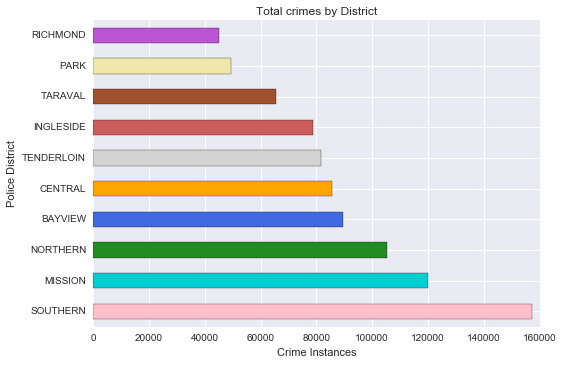

In [36]:
colors = ["pink", "darkturquoise", "forestgreen", "royalblue", "Orange", "lightgrey", "indianred", "sienna", "palegoldenrod", "mediumorchid"]
train_data["Category"].groupby(train_data["PdDistrict"]).count().sort_values(ascending=False).plot(kind='barh', color=colors)
plt.title("Total crimes by District")
plt.xlabel("Crime Instances")
plt.ylabel("Police District")

Top 5 crimes per district, on the same scale (0 to 45,000 instances)


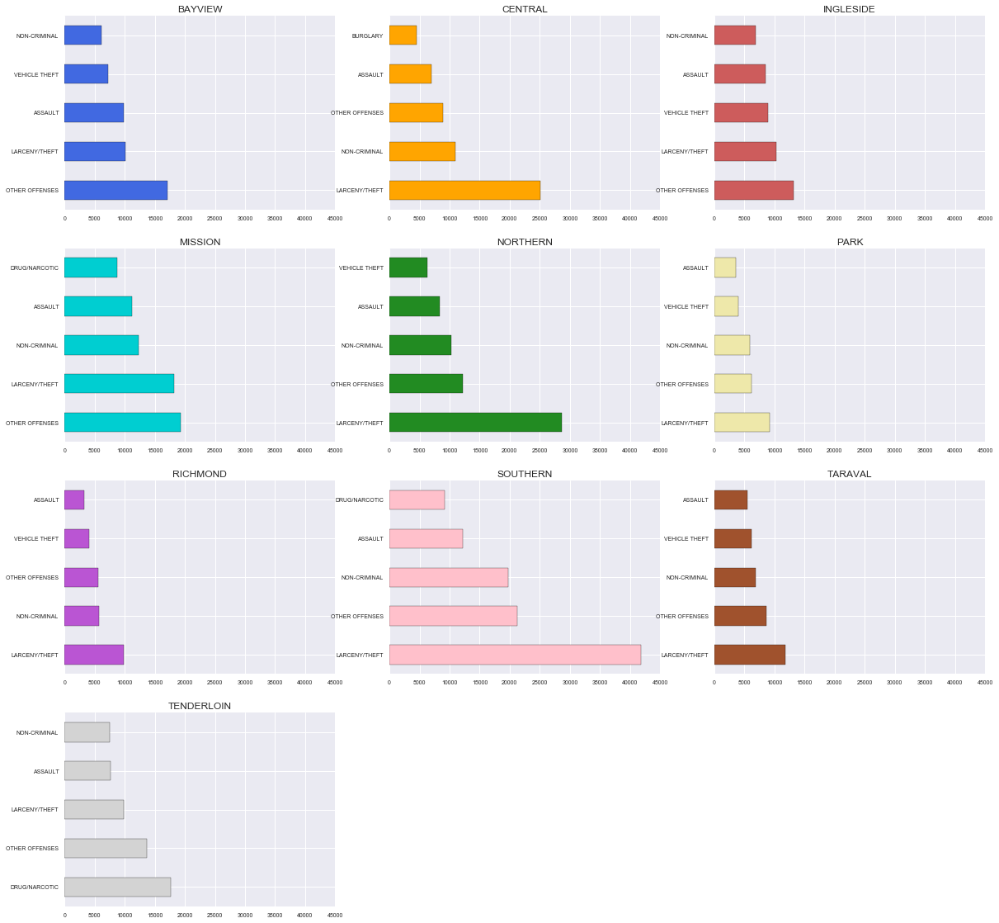

In [39]:
print("Top 5 crimes per district, on the same scale (0 to 45,000 instances)")
plt.figure(figsize=(20, 100))
colors = ["royalblue", "Orange", "indianred", "darkturquoise", "forestgreen", "palegoldenrod", "mediumorchid", "pink", "sienna", "lightgrey"]
i = 0
for district, group in train_data.groupby(train_data["PdDistrict"]):
    p = plt.subplot(20, 3, i+1)
    group["Category"].value_counts()[:5].plot(kind='barh', axes=p, fontsize=7, xlim=(0,45000), color=colors[i])
    plt.title(district)
    i = i + 1

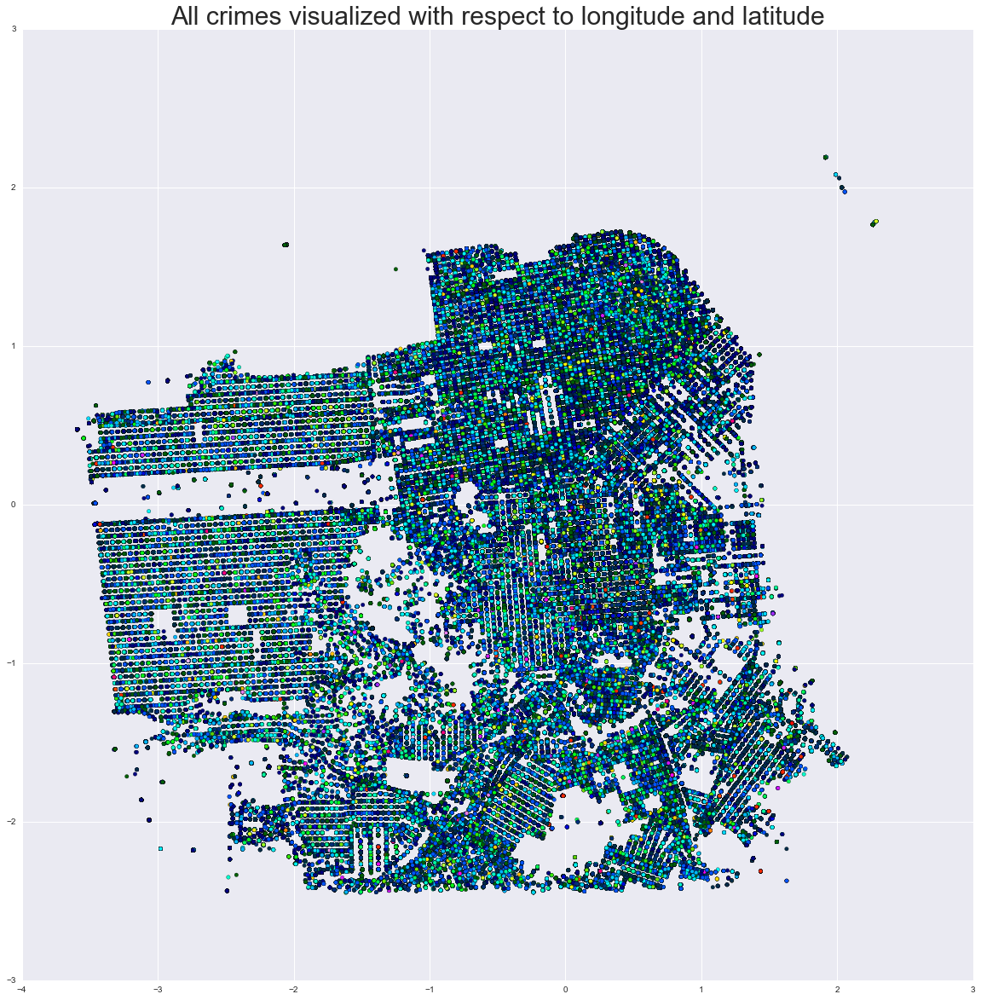

In [102]:
# Assign a color index to each crime category
color_map = dict(zip(crime_category_names, range(len(crime_categories))))

# Draw a scatter plot to show the crimes distribution
plt.figure(figsize=(20,20))
plt.scatter(train_data.X, train_data.Y, c=train_data.Category.map(color_map), cmap=plt.cm.gist_ncar)
plt.title("All crimes visualized with respect to longitude and latitude", fontsize=30)

Apparently, the scatter plot with all crimes is not very helpful. Crimes happened everywhere, and we didn't get deeper insight. We will make the scatter plot of every crime separatedly at the next step.

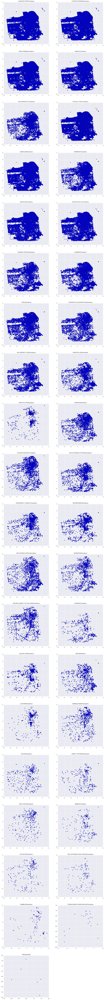

In [103]:
plt.figure(figsize=(16, 320))

for i in range(len(crime_category_names)):
    p = plt.subplot(40, 2, i+1)
    crime = crime_category_names[i]
    cur_crime_data = train_data[train_data.Category == crime]
    plt.title(crime + "locations")
    p.scatter(cur_crime_data.X, cur_crime_data.Y)

We can spot some trends with the scatterplots above, notably that some crimes are more prevalent at particular locations. For example, despite differing in total occurrences, Drug/Narcotic and Prostitution are both crimes that seem to have a high density on the Northeastern tip of SF. On the other hand, Vehicle Theft and Family Offenses are common in all areas of SF, and are spread out seemingly equally. Observing the density plots may help us to understand the concentration of various crimes, so we'll start with Prostitution and sex-related offenses.

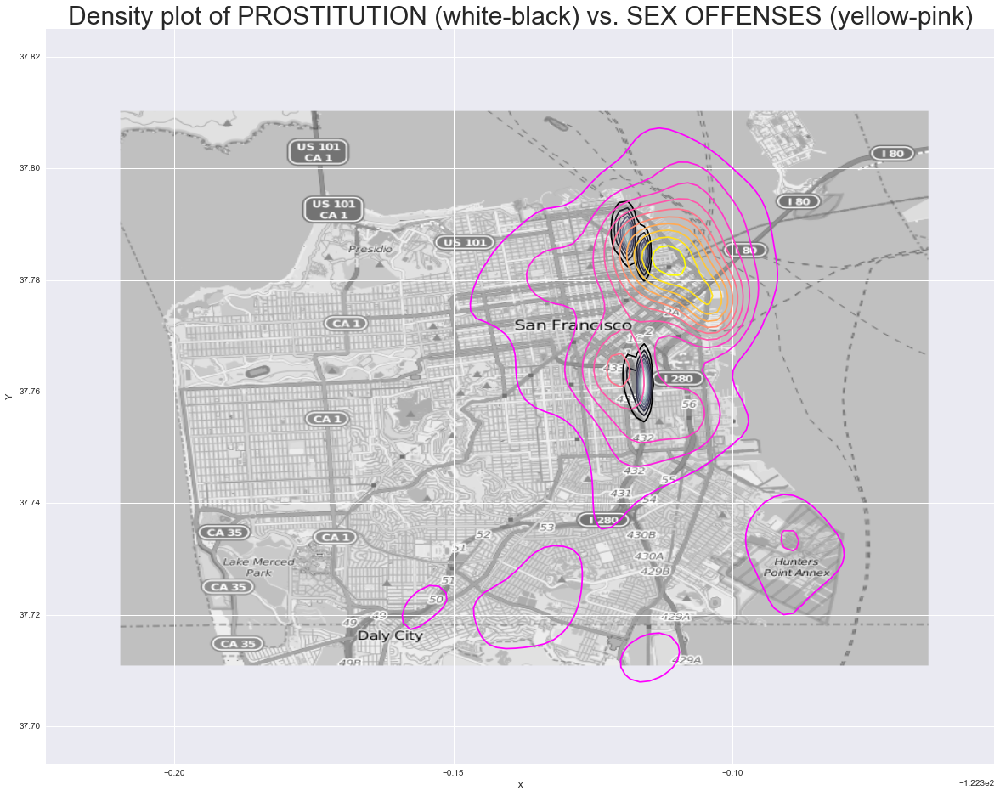

In [43]:
# Examine one type of crime (prostitution, in this case) more closely and compare with related crimes (other sex offenses)

# First, filter relevant data from the training set
prostitution_data = train_data[train_data.Category == "PROSTITUTION"]
sex_offenses = train_data[(train_data.Category == "SEX OFFENSES FORCIBLE") | (train_data.Category == "SEX OFFENSES NON FORCIBLE")]

# Overlay the prostitution location density plot and the sex offenses location density plot over the SF map image
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((prostitution_data.X.min(), prostitution_data.X.max(), prostitution_data.Y.min(), prostitution_data.Y.max()))
plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
sns.kdeplot(prostitution_data.X, prostitution_data.Y, n_levels=10, shade=False, cmap="bone")
sns.kdeplot(sex_offenses.X, sex_offenses.Y, n_levels=10, shade=False, cmap="spring")
plt.title("Density plot of PROSTITUTION (white-black) vs. SEX OFFENSES (yellow-pink)", fontsize=30)
plt.show()

We can observe that the densities for these sex-related crimes are different, and it may be useful to visualize others as well. However, as we saw with the scatterplots above, there are too many categories (30+) to observe on the same map to get a meaninful visual. Further categorization may be beneficial for co-plotting.

In [44]:
# This is an attempt to further categorize the crimes into 6 types + an "other" category

property_related = train_data[(train_data.Category == "LARCENY/THEFT") |
                              (train_data.Category == "VEHICLE THEFT") |
                              (train_data.Category == "VANDALISM") |
                              (train_data.Category == "BURGLARY") |
                              (train_data.Category == "TRESPASS") |
                              (train_data.Category == "STOLEN PROPERTY") |
                              (train_data.Category == "RECOVERED VEHICLE") |
                              (train_data.Category == "ARSON") |
                              (train_data.Category == "ROBBERY")]

person_related = train_data[(train_data.Category == "ASSAULT") |
                              (train_data.Category == "MISSING PERSON") |
                              (train_data.Category == "ROBBERY") |
                              (train_data.Category == "KIDNAPPING") |
                              (train_data.Category == "RUNAWAY") |
                              (train_data.Category == "FAMILY OFFENSES") |
                              (train_data.Category == "SUICIDE")]

drugs_sex_gambling_related = train_data[(train_data.Category == "DRUG/NARCOTIC") |
                              (train_data.Category == "DRUNKENNESS") |
                              (train_data.Category == "LIQUOR LAWS") |
                              (train_data.Category == "DRIVING UNDER THE INFLUENCE") |
                              (train_data.Category == "PROSTITUTION") |
                              (train_data.Category == "SEX OFFENSES FORCIBLE") |
                              (train_data.Category == "SEX OFFENSES NON FORCIBLE") |
                              (train_data.Category == "PORNOGRAPHY/OBSCENE MAT") |
                              (train_data.Category == "GAMBLING")]

weapon_violence_related = train_data[(train_data.Category == "WEAPON LAWS") |
                              (train_data.Category == "ARSON") |
                              (train_data.Category == "SEX OFFENSES FORCIBLE")]

fraudulent_behavior_related = train_data[(train_data.Category == "FRAUD") |
                              (train_data.Category == "FORGERY/COUNTERFEITING") |
                              (train_data.Category == "BAD CHECKS") |
                              (train_data.Category == "EMBEZZLEMENT") |
                              (train_data.Category == "BRIBERY") |
                              (train_data.Category == "EXTORTION") |
                              (train_data.Category == "TREA")]

general_misconduct_related = train_data[(train_data.Category == "LOITERING") |
                              (train_data.Category == "DISORDERLY CONDUCT") |
                              (train_data.Category == "SUSPICIOUS OCC")]

other_related = train_data[(train_data.Category == "OTHER OFFENSES") |
                              (train_data.Category == "NON-CRIMINAL") |
                              (train_data.Category == "WARRANTS") |
                              (train_data.Category == "SECONDARY CODES")]

Now that there are only 7 categories, we could try co-plotting the primary 6 and inspecting the "other" crimes

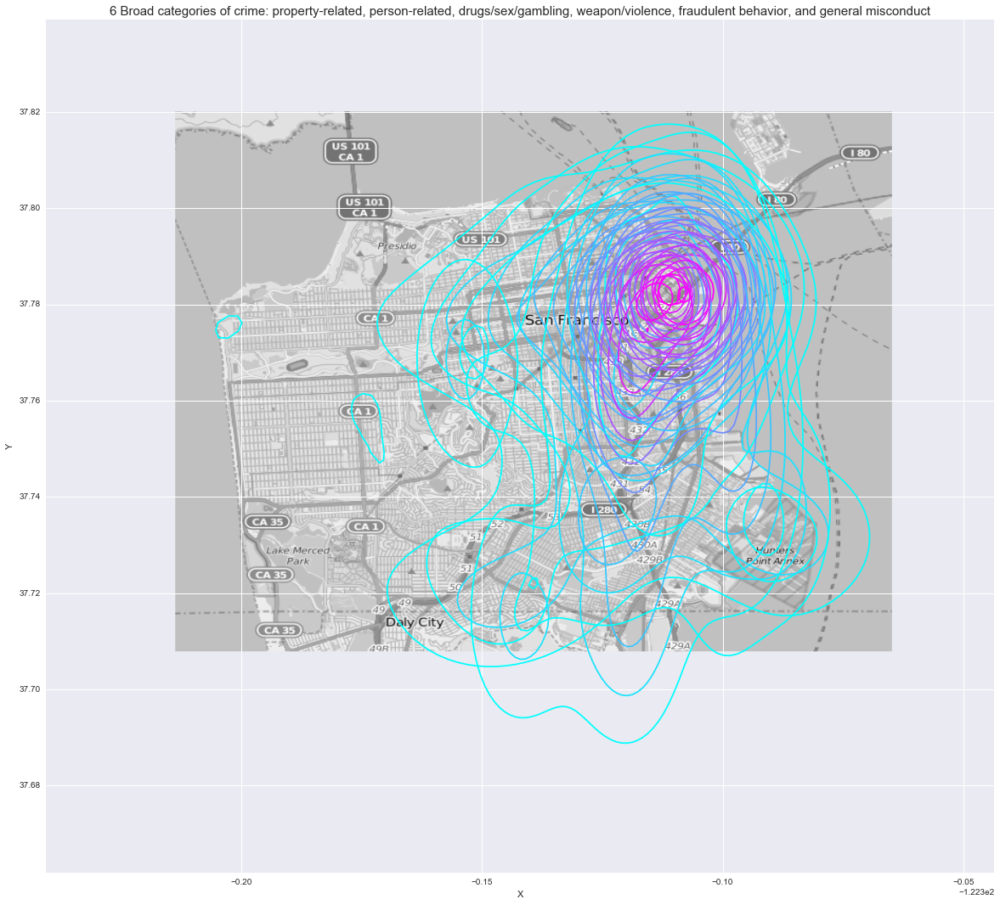

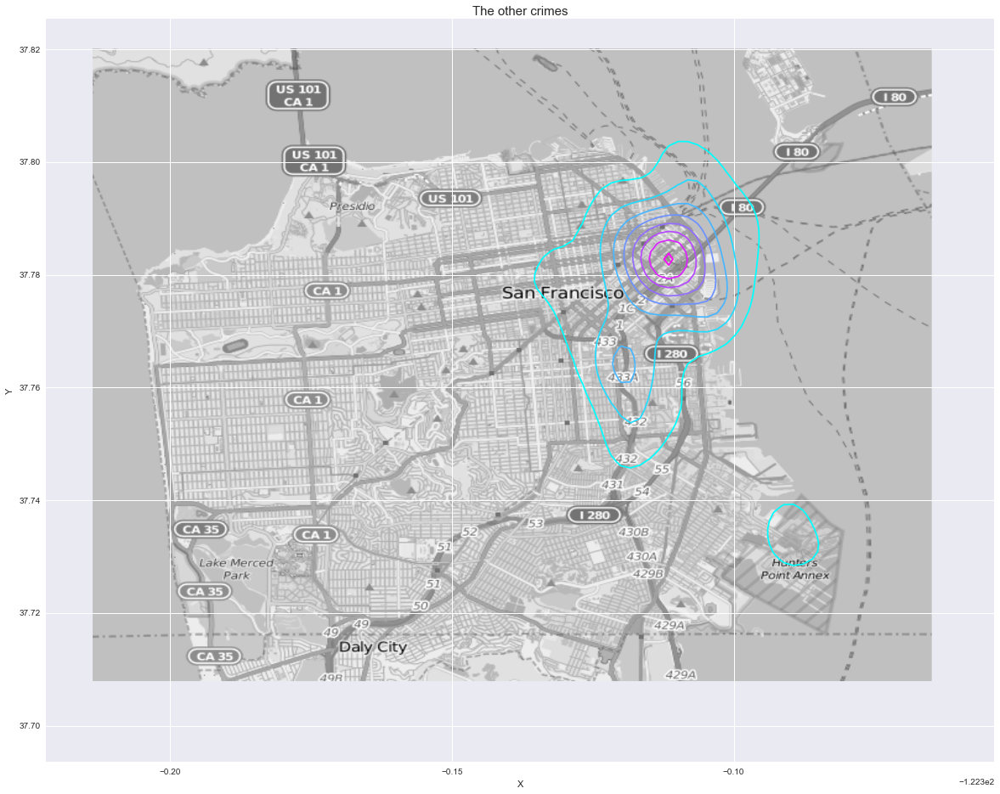

In [48]:
# Examine the 6 broader categories of crime
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((train_data.X.min(), train_data.X.max(), train_data.Y.min(), train_data.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
for df, name in zip([property_related, person_related, drugs_sex_gambling_related, weapon_violence_related,
                     fraudulent_behavior_related, general_misconduct_related], 
                    ["Property-related", "Person-related", "Drugs/Sex/Gambling", "Weapon/Violence",
                     "Fraudulent Behavior", "General Misconduct"]):
    shuffle = np.random.permutation(np.arange(df.shape[0]))
    samples = df.iloc[shuffle][:len(df)//1000]
    sns.kdeplot(samples.X, samples.Y, n_levels=10, shade=False, cmap="cool")
plt.title("6 Broad categories of crime: property-related, person-related, drugs/sex/gambling, weapon/violence, fraudulent behavior, and general misconduct", fontsize=15)
plt.show()

# Examine "Other Crimes" as the 7th category
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((other_related.X.min(), other_related.X.max(), other_related.Y.min(), other_related.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
shuffle = np.random.permutation(np.arange(other_related.shape[0]))
samples = other_related.iloc[shuffle][:len(other_related)//100]
sns.kdeplot(samples.X, samples.Y, n_levels=10, shade=False, cmap="cool")
plt.title("The other crimes", fontsize=15)
plt.show()

Even though fewer categories were used, the co-plot still looks messy. One immediate insight that can be gleaned is that highest crime densities, regardless of the category, are situated in the Northeastern Tip. "Other," nonspecific crimes do not tend to deviate past this hub, perhaps indicating that crime in Western SF may be more likely to be specific (or police are more likely to categorize it as specific, and hence issue an arrest under this more specific category)

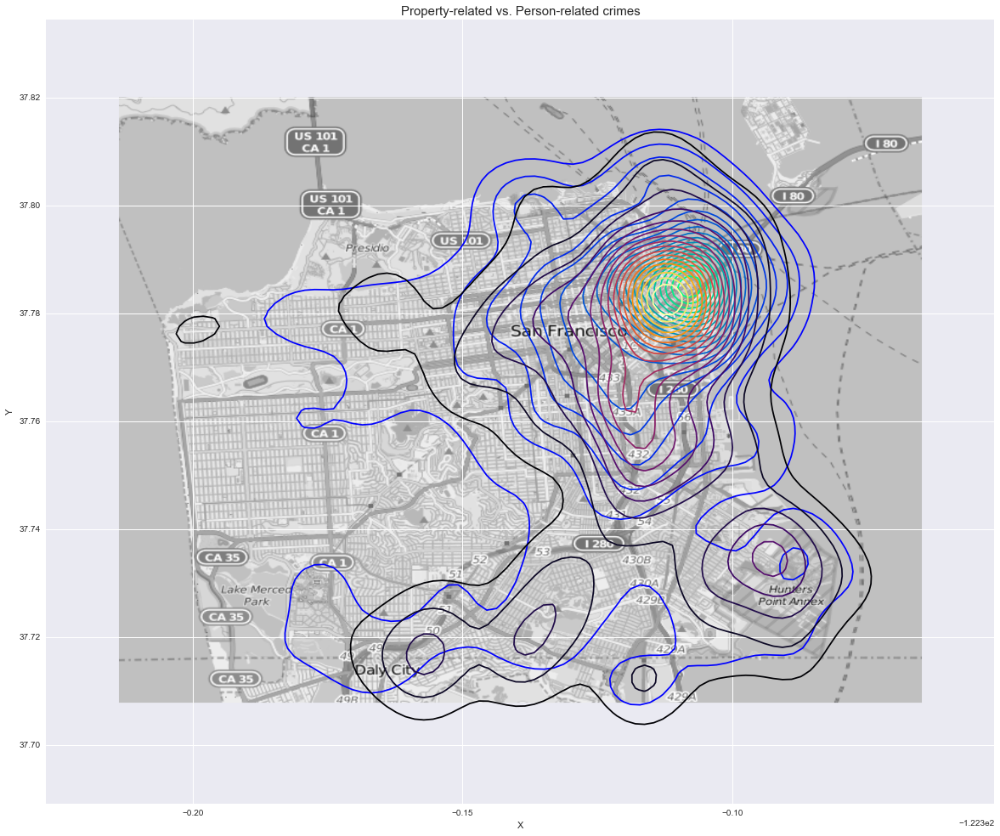

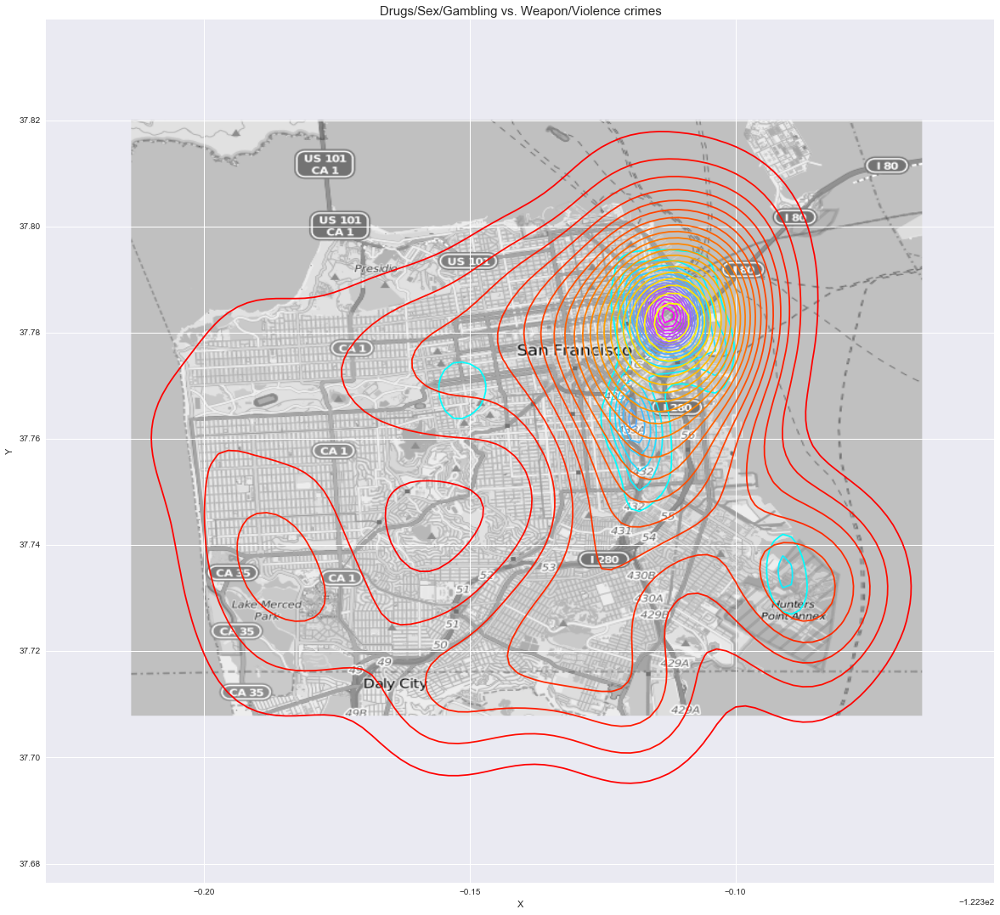

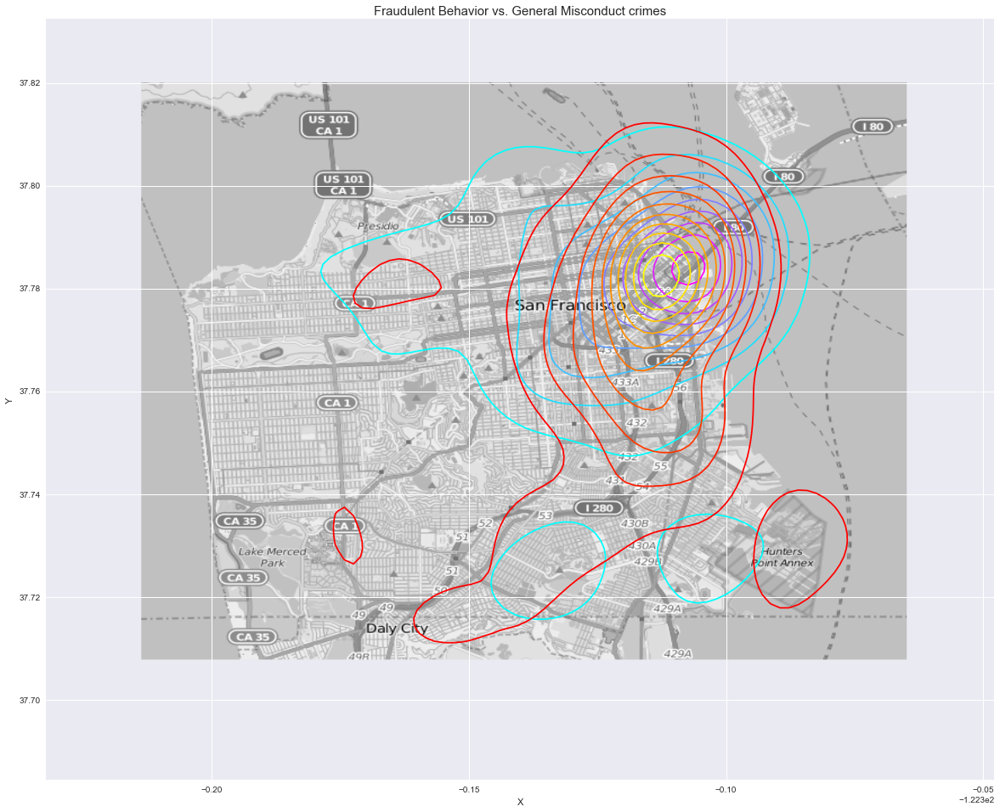

In [50]:
# Visualize density plots for the broad categories against each other

# Do property-related and person-related crimes occur in the same places?
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((train_data.X.min(), train_data.X.max(), train_data.Y.min(), train_data.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
for df, name, col in zip([property_related, person_related], ["Property-related", "Person-related"], ["winter", "inferno"]):
    shuffle = np.random.permutation(np.arange(df.shape[0]))
    samples = df.iloc[shuffle][:len(df)//100]
    sns.kdeplot(samples.X, samples.Y, n_levels=20, shade=False, cmap=col)
plt.title("Property-related vs. Person-related crimes", fontsize=15)
plt.show()

# How about drugs, sex, and gambling versus weapon/violence?
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((train_data.X.min(), train_data.X.max(), train_data.Y.min(), train_data.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
for df, name, col in zip([drugs_sex_gambling_related, weapon_violence_related], ["Drugs/Sex/Gambling", "Weapon/Violence"], ["cool", "autumn"]):
    shuffle = np.random.permutation(np.arange(df.shape[0]))
    samples = df.iloc[shuffle][:len(df)//100]
    sns.kdeplot(samples.X, samples.Y, n_levels=20, shade=False, cmap=col)
plt.title("Drugs/Sex/Gambling vs. Weapon/Violence crimes", fontsize=15)
plt.show()

# What about fradulent behavior and (typically less serious) general misconduct?
fig, ax = plt.subplots(figsize=(20, 20))
xy_lim = list((train_data.X.min(), train_data.X.max(), train_data.Y.min(), train_data.Y.max()))

plt.imshow(map_data, extent=xy_lim, cmap=plt.get_cmap('gray'))
for df, name, col in zip([fraudulent_behavior_related, general_misconduct_related], ["Fraudulent Behavior", "General Misconduct"], ["cool", "autumn"]):
    shuffle = np.random.permutation(np.arange(df.shape[0]))
    samples = df.iloc[shuffle][:len(df)//100]
    sns.kdeplot(samples.X, samples.Y, n_levels=10, shade=False, cmap=col)
plt.title("Fraudulent Behavior vs. General Misconduct crimes", fontsize=15)
plt.show()

After attempting to recategorize crime categories based on the (human-determined) nature of the crime, there still appears to be overlap. Person- and property-related crimes occur in similar locations, as do fraudulent behavior and general misconduct. The largest visual difference is found to be between the following two types of crime: drugs/sex/gambling and weapon/violence, with the former concentrated slightly farther from the Northeastern Tip than most other crimes, and the latter following a similar pattern to property- and person-related crimes.

### WHEN do crimes occur?

Besides location, time can also offer a rich set of features. Before delving into detailed feature engineering, let's visually explore the primary source of time-related information: the "Dates" column. From these timestamps, we can focus our attention on hour, month, and year as a starting point.

In [16]:
train_data["Dates"] = pd.to_datetime(train_data["Dates"], format="%Y-%m-%d %H:%M:%S")
train_data["Hour"] = train_data["Dates"].map(lambda x: x.hour)
train_data["Month"] = train_data["Dates"].map(lambda x: x.month)
train_data["Year"] = train_data["Dates"].map(lambda x: x.year)

First, observe the overall trend for all crimes.

CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)


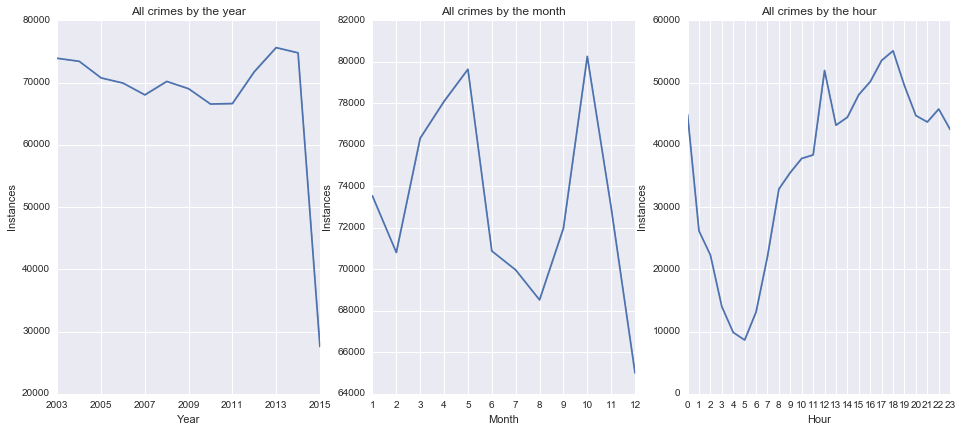

In [17]:
# All crimes by the hour, month, and year
plt.figure(figsize=(16, 320))
print("CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)")
for i, time in zip(range(3), ["Year", "Month", "Hour"]):
    time_data = {}
    p = plt.subplot(40, 3, i+1)
    for unit in train_data[time].unique():
        time_data[unit] = len(train_data[train_data[time] == unit])
        
    # Plot either a line chart (default) or bar chart (uncomment)
    sns.tsplot(data=list(time_data.values()), time=list(time_data.keys()))
    #plt.bar(list(time_data.keys()), list(time_data.values()))
    
    if time == "Year":
        # 1-by-1 tick marks are too close, resulting in label overlap of the years
        plt.xticks(np.arange(train_data[time].unique().min(),train_data[time].unique().max()+1,2))
    else:
        plt.xticks(np.arange(train_data[time].unique().min(),train_data[time].unique().max()+1,1))
    plt.title("All crimes by the " + time.lower())
    plt.ylabel("Instances")
    plt.xlabel(time)

The incidence of all crimes seemed to have decreased recently, with very low counts for 2015 (leftmost chart). Such a steep decrease (>50% reduction) is odd, and may suggest incomplete data for 2015. If we were to give greater weightage to more recent years, including 2013 and 2014 may be more beneficial than 2015 alone. For all other years, crime occurrences remained at relatively constant levels. Although not shown in this notebook, inspection in Tableau revealed that this is also observable for most days of the month for all districts.

CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)


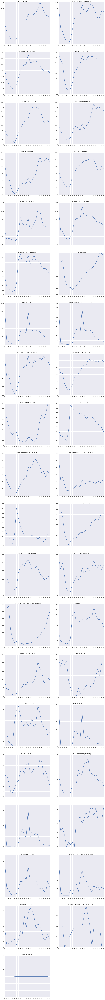

In [18]:
# By the hour
plt.figure(figsize=(16, 320))
print("CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)")
for i in range(len(crime_category_names)):
    p = plt.subplot(40, 2, i+1)
    crime = crime_category_names[i]
    cur_crime_data = train_data[train_data.Category == crime]
    hourly_data = {}
    for hour in cur_crime_data.Hour.unique():
        hourly_data[hour] = len(cur_crime_data[(cur_crime_data.Hour == hour)])
    sns.tsplot(data=list(hourly_data.values()), time=list(hourly_data.keys()))
    plt.xticks(np.arange(train_data.Hour.unique().min(),train_data.Hour.unique().max()+1,1))
    plt.title(crime + " (HOURLY)")

CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)


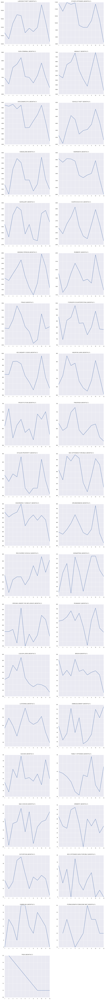

In [19]:
# By the month
plt.figure(figsize=(16, 320))
print("CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)")
for i in range(len(crime_category_names)):
    p = plt.subplot(40, 2, i+1)
    crime = crime_category_names[i]
    cur_crime_data = train_data[train_data.Category == crime]
    monthly_data = {}
    for month in cur_crime_data.Month.unique():
        monthly_data[month] = len(cur_crime_data[(cur_crime_data.Month == month)])
    sns.tsplot(data=list(monthly_data.values()), time=list(monthly_data.keys()))
    plt.xticks(np.arange(train_data.Month.unique().min(),train_data.Month.unique().max()+1,1))
    plt.title(crime + " (MONTHLY)")
    

CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)


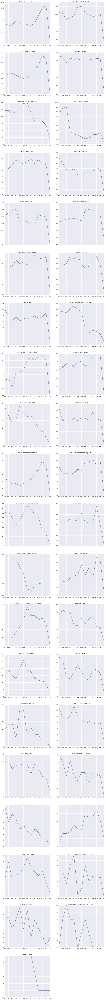

In [20]:
# By the year
plt.figure(figsize=(16, 320))
print("CAUTION: SCALES ARE DIFFERENT (so only use to notice the trend)")
for i in range(len(crime_category_names)):
    p = plt.subplot(40, 2, i+1)
    crime = crime_category_names[i]
    cur_crime_data = train_data[train_data.Category == crime]
    yearly_data = {}
    for year in cur_crime_data.Year.unique():
        yearly_data[year] = len(cur_crime_data[(cur_crime_data.Year == year)])
    sns.tsplot(data=list(yearly_data.values()), time=list(yearly_data.keys()))
    plt.xticks(np.arange(train_data.Year.unique().min(),train_data.Year.unique().max()+1,1))
    plt.title(crime + " (YEARLY)")

In [21]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 877982 entries, 0 to 878048
Data columns (total 12 columns):
Dates         877982 non-null datetime64[ns]
Category      877982 non-null object
Descript      877982 non-null object
DayOfWeek     877982 non-null object
PdDistrict    877982 non-null object
Resolution    877982 non-null object
Address       877982 non-null object
X             877982 non-null float64
Y             877982 non-null float64
Hour          877982 non-null int64
Month         877982 non-null int64
Year          877982 non-null int64
dtypes: datetime64[ns](1), float64(2), int64(3), object(6)
memory usage: 87.1+ MB


# Feature Engineering

Partly inspired by the exploratory data analysis and partly by intuition, the features we chose to include and/or engineer are the following:

TIME-related: minute, hour, day, month, year, hour zone, season (removed for final model), week of year, day of week & whether the day is a weekday or weekend

LOCATION-related: street names, type of street, whether it's an on intersection or a block, the closest police district, valid longitude values, valid latitude values, and a series of transformed longitude and latitude values.

In [22]:
# Transform the Date into a python datetime object.
train_data["Dates"] = pd.to_datetime(train_data["Dates"], format="%Y-%m-%d %H:%M:%S")
test_data["Dates"] = pd.to_datetime(test_data["Dates"], format="%Y-%m-%d %H:%M:%S")

In [23]:
# Add Minute
train_data["Minute"] = train_data["Dates"].map(lambda x: x.minute)
test_data["Minute"] = test_data["Dates"].map(lambda x: x.minute)
    
print(sorted(train_data['Minute'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59]


In [24]:
# Add Hour
train_data["Hour"] = train_data["Dates"].map(lambda x: x.hour)
test_data["Hour"] = test_data["Dates"].map(lambda x: x.hour)
    
print(sorted(train_data['Hour'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]


In [25]:
# Add Day
train_data["Day"] = train_data["Dates"].map(lambda x: x.day)
test_data["Day"] = test_data["Dates"].map(lambda x: x.day)
    
print(sorted(train_data['Day'].unique()))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]


In [26]:
# Add Month
train_data["Month"] = train_data["Dates"].map(lambda x: x.month)
test_data["Month"] = test_data["Dates"].map(lambda x: x.month)
    
print(sorted(train_data['Month'].unique()))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


In [27]:
# Add Year
train_data["Year"] = train_data["Dates"].map(lambda x: x.year - 2003)   
test_data["Year"] = test_data["Dates"].map(lambda x: x.year - 2003)

print(sorted(train_data['Year'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


In [28]:
# Add Hour Zone
def get_hour_zone(hour):
    if hour >= 2 and hour < 8: 
        return 0
    elif hour >= 8 and hour < 12: 
        return 1
    elif hour >= 12 and hour < 18: 
        return 2
    elif hour >= 18 and hour < 22: 
        return 3
    elif hour < 2 or hour >= 22: 
        return 4
    
train_data["Hour_Zone"] = train_data["Hour"].map(get_hour_zone)
test_data["Hour_Zone"] = test_data["Hour"].map(get_hour_zone)

print(sorted(train_data['Hour_Zone'].unique()))

[0, 1, 2, 3, 4]


In [29]:
# Add Season
def get_season(month):
    if month in set([3, 4, 5]): 
        return 0
    elif month in set([6, 7, 8]): 
        return 1
    elif month in set([9, 10, 11]): 
        return 2
    elif month in set([12, 1, 2]): 
        return 3
    
train_data["Season"] = train_data["Month"].map(get_season)
test_data["Season"] = test_data["Month"].map(get_season)

print(sorted(train_data['Season'].unique()))

[0, 1, 2, 3]


In [30]:
# Add Week of Year
train_data["WeekOfYear"] = train_data["Dates"].map(lambda x: x.weekofyear / 2 - 1)
test_data["WeekOfYear"] = test_data["Dates"].map(lambda x: x.weekofyear / 2)

print(sorted(train_data['WeekOfYear'].unique()))
print(sorted(test_data['WeekOfYear'].unique()))

[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0]
[0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5, 9.5, 10.5, 11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5, 22.5, 23.5, 24.5, 25.5, 26.5]


In [31]:
# Add a binary feature standing for whether the day is weekend
train_data["Is_Weekend"] = train_data["DayOfWeek"].map(lambda day: 1 if day in set(['Sunday', 'Saturday']) else 0)
test_data["Is_Weekend"] = test_data["DayOfWeek"].map(lambda day: 1 if day in set(['Sunday', 'Saturday']) else 0)

print(sorted(train_data['Is_Weekend'].unique()))

[0, 1]


In [32]:
# Add numeric DayOfWeek feature
dayofweek_encoder = LabelEncoder()
dayofweek_encoder.fit(train_data['DayOfWeek'])

train_data["DayOfWeek_Num"] = dayofweek_encoder.transform(train_data['DayOfWeek'])
test_data["DayOfWeek_Num"] = dayofweek_encoder.transform(test_data['DayOfWeek'])

print(sorted(train_data['DayOfWeek_Num'].unique()))

[0, 1, 2, 3, 4, 5, 6]


In [33]:
# Add two features, stree1 and steet2, standing for street names. 
# The address either contains one street, or is the intersection of two streets. If the address contains one street,
# the first street should be the original address value, while the second street should be None. Otherwise, the two
# street features will contain the two street names respectively.
print('Before Transformation:')
print_full(train_data['Address'].head(20))

# Extract the first street name from the address. If the extracted street name is not in seen_streets, it should be 
# assigned None anywhere. This applies when a steet name is in test data but not in train data.
def extract_street1(address, seen_streets=None):
    street1 = address.split(' / ')[0]
    if seen_streets is None or street1 in seen_streets:
        return street1
    else:
        return 'None'

# Extract the second street name from the address, or None if the address only contains one street name.
def extract_street2(address, seen_streets=None):
    streets = address.split(' / ')
    street2 = 'None' if len(streets) == 1 else streets[1]
    if seen_streets is None or street2 in seen_streets:
        return street2
    else:
        return 'None'

# This regex pattern will match the block number in an address and we will remove it.
re_pattern = '[0-9]+ Block of '
addresses = train_data["Address"].map(lambda address: re.sub(re_pattern, '', address))
train_data["Street1"] = addresses.apply(extract_street1)
train_data["Street2"] = addresses.apply(extract_street2)

seen_streets = set(train_data['Street1'].append(train_data['Street2']).unique())
seen_streets.discard('None')
print('\nThe number of unique streets in the train data is %d\n' % (len(seen_streets),))

addresses = test_data["Address"].map(lambda address: re.sub(re_pattern, '', address))
test_data["Street1"] = addresses.apply(extract_street1, args=(seen_streets,))
test_data["Street2"] = addresses.apply(extract_street2, args=(seen_streets,))

print('After Transformation:')
print_full(train_data['Street1'].head(20))
print_full(train_data['Street2'].head(20))

# Transform the Address to catogorical data
street_encoder = LabelEncoder()
seen_streets = list(seen_streets) + ['None']
street_encoder.fit(seen_streets)
train_data["Street1"] = street_encoder.transform(train_data['Street1'])
train_data["Street2"] = street_encoder.transform(train_data['Street2'])
test_data["Street1"] = street_encoder.transform(test_data['Street1'])
test_data["Street2"] = street_encoder.transform(test_data['Street2'])

# Exchange street1 and stree2 values to guarantee the value of street1 is smaller than street2
# This step is to avoid the model from thinking "street1, street2" != "street2, street1"
for index, row in train_data.iterrows():
    if row['Street1'] > row['Street2']:
        row['Street1'], row['Street2'] = row['Street2'], row['Street1']

for index, row in test_data.iterrows():
    if row['Street1'] > row['Street2']:
        row['Street1'], row['Street2'] = row['Street2'], row['Street1']

Before Transformation:
0                OAK ST / LAGUNA ST
1                OAK ST / LAGUNA ST
2         VANNESS AV / GREENWICH ST
3          1500 Block of LOMBARD ST
4         100 Block of BRODERICK ST
5               0 Block of TEDDY AV
6               AVALON AV / PERU AV
7          KIRKWOOD AV / DONAHUE ST
8              600 Block of 47TH AV
9     JEFFERSON ST / LEAVENWORTH ST
10    JEFFERSON ST / LEAVENWORTH ST
11            0 Block of ESCOLTA WY
12               TURK ST / JONES ST
13           FILLMORE ST / GEARY BL
14         200 Block of WILLIAMS AV
15            0 Block of MENDELL ST
16               EDDY ST / JONES ST
17           GODEUS ST / MISSION ST
18           MENDELL ST / HUDSON AV
19            100 Block of JONES ST
Name: Address, dtype: object

The number of unique streets in the train data is 2075

After Transformation:
0           OAK ST
1           OAK ST
2       VANNESS AV
3       LOMBARD ST
4     BRODERICK ST
5         TEDDY AV
6        AVALON AV
7      KIRKWOOD 

In [34]:
# Add the address type as a categorical feature.
# We will use the street type of the first street, if the address is an intersection of two 
# streets with different types.

# This list can be obtained from inspecting the data
valid_street_types = ['AL', 'AV', 'BL', 'BU', 'CR', 'CT', 'DR', 'EX', 'FE', 'HW', 'HY', 'LN', 'MA',
                      'PA', 'PL', 'PZ', 'RD', 'RW', 'ST', 'TE', 'TR', 'WA', 'WK', 'WY']
street_type_encoder = LabelEncoder()

# 'OT' standss for 'Other'. It will be used when an address value is unconventional, or an address type 
# can only be found in test data but not train data.
street_type_encoder.fit(valid_street_types + ['OT'])

# This function extracts the street type from a street name
def get_street_types(streets):
    streets = streets.reshape(streets.shape[0], 1)
    # Extract the suffix of the street name
    street_types = np.apply_along_axis(lambda street: street[0].split()[-1], 1, streets)
    street_types = street_types.reshape(street_types.shape[0], 1)
    # Replace the street type by 'OT' if the street type is not a legit value
    street_types = np.apply_along_axis(lambda street_type: street_type[0] if street_type[0] in valid_street_types
                                       else 'OT', 1, street_types)
    
    return street_types.reshape(street_types.shape[0], 1)
    

train_streets = street_encoder.inverse_transform(train_data["Street1"])
train_street_types = get_street_types(train_streets)
train_data['Street_Type'] = street_type_encoder.transform(train_street_types)

test_streets = street_encoder.inverse_transform(test_data["Street1"])
test_street_types = get_street_types(test_streets)
test_data['Street_Type'] = street_type_encoder.transform(test_street_types)

print(sorted(train_data['Street_Type'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]


/Users/PJ/anaconda/envs/python3/lib/python3.5/site-packages/sklearn/preprocessing/label.py:147: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [35]:
# Add a feature indicating whether the address locates at the intersection of two streets
train_data["Is_Intersection"] = train_data["Address"].map(lambda address: 0 if ' / ' in address else 1)
test_data["Is_Intersection"] = test_data["Address"].map(lambda address: 0 if ' / ' in address else 1)

print(sorted(train_data['Is_Intersection'].unique()))

[0, 1]


In [36]:
# Add a feature indicating whether the address is with a block number
train_data["Is_Block"] = train_data["Address"].map(lambda address: 0 if 'Block' in address else 1)
test_data["Is_Block"] = test_data["Address"].map(lambda address: 0 if 'Block' in address else 1)

print(sorted(train_data['Is_Block'].unique()))

[0, 1]


In [37]:
# Add numeric PdDistrict feature
discrict_encoder = LabelEncoder()
discrict_encoder.fit(train_data['PdDistrict'])

train_data["PdDistrict_Num"] = discrict_encoder.transform(train_data['PdDistrict'])
test_data["PdDistrict_Num"] = discrict_encoder.transform(test_data['PdDistrict'])

print(sorted(train_data['PdDistrict_Num'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [38]:
# Normalize X and Y
print('There are %d unique longitude values, %d unique latitude values' % (train_data['X'].nunique(), 
                                                                           train_data['Y'].nunique()))

xy_scalar = preprocessing.StandardScaler().fit(train_data[['X', 'Y']])
train_data[['X', 'Y']] = xy_scalar.transform(train_data[['X', 'Y']])
test_data[['X', 'Y']] = xy_scalar.transform(test_data[['X', 'Y']])

There are 34242 unique longitude values, 34242 unique latitude values


In [39]:
# X-Y plane rotation and space transformation to extract more spatial information
# 2-dimensional rotation based on below functions:
# rotated x = xcos - ysin
# rotated y = xsin + ycos
# cartesian space -> polar space

cos_30 = 1.732/2
sin_30 = 1./2
cos_45 = .707
sin_45 = .707
cos_60 = 1./2
sin_60 = 1.732/2

train_data["Rot30_X"] = train_data['X'] * cos_30 - train_data['Y'] * sin_30 
train_data["Rot30_Y"] = train_data['X'] * sin_30 + train_data['Y'] * cos_30
train_data["Rot45_X"] = train_data['X'] * cos_45 - train_data['Y'] * sin_45  
train_data["Rot45_Y"] = train_data['X'] * sin_45 + train_data['Y'] * cos_45
train_data["Rot60_X"] = train_data['X'] * cos_60 - train_data['Y'] * sin_60  
train_data["Rot60_Y"] = train_data['X'] * sin_60 + train_data['Y'] * cos_60
train_data["Radius"] = np.sqrt(train_data['X'] ** 2 + train_data['Y'] ** 2)
train_data["Angle"] = np.arctan2(train_data['X'], train_data['Y'])

test_data["Rot30_X"] = train_data['X'] * cos_30 - train_data['Y'] * sin_30  
test_data["Rot30_Y"] = train_data['X'] * sin_30 + train_data['Y'] * cos_30
test_data["Rot45_X"] = train_data['X'] * cos_45 - train_data['Y'] * sin_45  
test_data["Rot45_Y"] = train_data['X'] * sin_45 + train_data['Y'] * cos_45
test_data["Rot60_X"] = train_data['X'] * cos_60 - train_data['Y'] * sin_60  
test_data["Rot60_Y"] = train_data['X'] * sin_60 + train_data['Y'] * cos_60
test_data["Radius"] = np.sqrt(test_data['X'] ** 2 + test_data['Y'] ** 2)
test_data["Angle"] = np.arctan2(test_data['X'], test_data['Y'])

In [40]:
# View the description of the numerical features again to ensure everything is right
train_data.describe()

,X,Y,Hour,Month,Year,Minute,Day,Hour_Zone,Season,WeekOfYear,...,Is_Block,PdDistrict_Num,Rot30_X,Rot30_Y,Rot45_X,Rot45_Y,Rot60_X,Rot60_Y,Radius,Angle
count,8.779820e+05,8.779820e+05,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,877982.000000,...,877982.000000,877982.000000,8.779820e+05,8.779820e+05,8.779820e+05,8.779820e+05,8.779820e+05,8.779820e+05,877982.000000,877982.000000
mean,7.423064e-13,2.309516e-13,13.412737,6.436416,5.712378,20.155163,15.570501,2.212722,1.466810,12.185252,...,0.296989,4.445263,5.266005e-13,5.843533e-13,3.667199e-13,6.958368e-13,1.618898e-13,7.636448e-13,1.219310,0.278948
std,1.000001e+00,1.000001e+00,6.549521,3.428998,3.631126,18.595053,8.782976,1.214324,1.122023,7.483002,...,0.456932,2.863686,9.308286e-01,1.064647e+00,9.195493e-01,1.074164e+00,9.308286e-01,1.064647e+00,0.716438,1.652435
min,-3.594245e+00,-2.448026e+00,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-3.349214e+00,-3.369688e+00,-2.884222e+00,-3.641279e+00,-2.450047e+00,-3.665655e+00,0.020124,-3.141457
25%,-4.029502e-01,-6.044895e-01,9.000000,3.000000,3.000000,0.000000,8.000000,1.000000,0.000000,6.000000,...,0.000000,2.000000,-4.146335e-01,-5.665709e-01,-4.910049e-01,-5.402855e-01,-5.844560e-01,-4.590568e-01,0.742428,-1.066285
50%,2.508867e-01,3.470394e-01,14.000000,6.000000,6.000000,19.000000,16.000000,2.000000,1.000000,12.000000,...,0.000000,4.000000,6.281206e-02,2.144100e-01,-9.703325e-02,2.239599e-01,-2.373000e-01,3.123907e-01,1.003760,0.508922
75%,6.250658e-01,7.172913e-01,19.000000,9.000000,9.000000,33.000000,23.000000,3.000000,2.000000,19.000000,...,1.000000,7.000000,4.804751e-01,8.071599e-01,4.085336e-01,7.866507e-01,5.060865e-01,7.512170e-01,1.639593,1.172441
max,2.286996e+00,2.190842e+00,23.000000,12.000000,12.000000,59.000000,31.000000,4.000000,3.000000,25.000000,...,1.000000,9.000000,2.596205e+00,2.856116e+00,2.828614e+00,2.904734e+00,2.868980e+00,2.873783e+00,3.686445,3.141244


In [41]:
# Transform Category to categorical data
criminal_labels = sorted(train_data['Category'].unique())
labels_map = dict(zip(criminal_labels, range(len(criminal_labels))))
train_data['Category_Num'] = train_data['Category'].map(labels_map)

Not all of the above features will be used for the final model, because some may have low importances and possibly act as noise to the model.

# Model Cross Validation

In [42]:
print(train_data.info())

# Define the columns of all available features here
time_features = ['Minute', 'Hour', 'Day', 'Month', 'Year', 'Hour_Zone', 'Season', 
                 'WeekOfYear', 'DayOfWeek_Num', 'Is_Weekend']

address_features = ['Street1', 'Street2', 'Street_Type', 'PdDistrict_Num', 'Is_Intersection', 'Is_Block']

geometry_features = ['X', 'Y', 'Rot45_X', 'Rot45_Y', 'Rot30_X', 'Rot30_Y', 
                     'Rot60_X', 'Rot60_Y', 'Radius', 'Angle']

all_features = time_features + address_features + geometry_features

print('The total features count is %d' % len(all_features))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 877982 entries, 0 to 878048
Data columns (total 34 columns):
Dates              877982 non-null datetime64[ns]
Category           877982 non-null object
Descript           877982 non-null object
DayOfWeek          877982 non-null object
PdDistrict         877982 non-null object
Resolution         877982 non-null object
Address            877982 non-null object
X                  877982 non-null float64
Y                  877982 non-null float64
Hour               877982 non-null int64
Month              877982 non-null int64
Year               877982 non-null int64
Minute             877982 non-null int64
Day                877982 non-null int64
Hour_Zone          877982 non-null int64
Season             877982 non-null int64
WeekOfYear         877982 non-null float64
Is_Weekend         877982 non-null int64
DayOfWeek_Num      877982 non-null int64
Street1            877982 non-null int64
Street2            877982 non-null int64
Street_

Cumulative explained variance: 
 [ 0.          0.7164234   0.99881868  0.99946818  0.99961781  0.99974021
  0.99984658  0.99992765  0.99995236  0.99997066  0.99997905  0.99998678
  0.99999191  0.99999417  0.99999638  0.99999799  0.99999857  0.99999911
  0.99999964  1.          1.          1.          1.          1.          1.
  1.          1.        ]


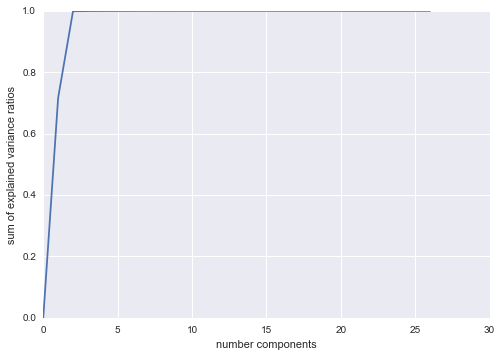

In [43]:
# perform PCA
pca_mod = PCA()
pca_mod.fit(train_data[all_features])

evr = pca_mod.explained_variance_ratio_
s_evr = np.cumsum(np.concatenate(([0], evr)))

print('Cumulative explained variance: \n', s_evr)

plt.plot(range(len(s_evr)),s_evr)
plt.xlabel('number components')
plt.ylabel('sum of explained variance ratios')
plt.ylim([0,1])
plt.show()

It turns out the applying PCA to our model will decrease the performance, probably because essential information is lost in the PCA process. Besides, we don't have millions of features which render the PCA process a must. So we will not apply PCA here.

In [44]:
# Divide data into train and dev data set and conduct cross-validation
mini_train_data, mini_dev_data, mini_train_labels, mini_dev_labels = train_test_split(train_data[all_features], 
                                                                                      train_data['Category_Num'], 
                                                                                      test_size=0.5)

random_forest = RandomForestClassifier(max_depth=50, n_estimators=50, min_samples_split=200, n_jobs=2)
random_forest.fit(mini_train_data, mini_train_labels)

pred_probs = random_forest.predict_proba(mini_dev_data)
pred_labels = random_forest.predict(mini_dev_data)

if mini_dev_labels.nunique() != pred_probs.shape[1]:
    print('Please run the cell again to get the multiclass loss.')
else:
    total_loss = log_loss(mini_dev_labels, pred_probs)
    print('The multiclass loss of Random Forest model is %.4f' % total_loss)
    
    rf_accuracy = np.mean(mini_dev_labels == pred_labels)
    print('The accuracy of Random Forest model is %.4f' % rf_accuracy)
    
    feature_weights = pd.DataFrame({'Feature': all_features, 'Weight': random_forest.feature_importances_})
    print(feature_weights.sort_values(by='Weight', ascending=False).reset_index(drop=True))

The multiclass loss of Random Forest model is 2.3197
The accuracy of Random Forest model is 0.3079
            Feature    Weight
0            Minute  0.138961
1           Rot45_Y  0.068707
2           Rot60_X  0.064764
3           Rot30_Y  0.062149
4                 Y  0.061363
5             Angle  0.055172
6           Rot60_Y  0.054195
7           Rot45_X  0.052357
8                 X  0.052288
9            Radius  0.051546
10             Hour  0.046647
11          Rot30_X  0.046288
12             Year  0.041599
13         Is_Block  0.037656
14          Street1  0.029349
15  Is_Intersection  0.024970
16        Hour_Zone  0.024301
17   PdDistrict_Num  0.022575
18          Street2  0.018390
19              Day  0.011790
20       WeekOfYear  0.010293
21    DayOfWeek_Num  0.006677
22            Month  0.006381
23      Street_Type  0.005368
24       Is_Weekend  0.003214
25           Season  0.003001


In [45]:
# Exclude unimportant features from the features set for the final model
data_features = ['Minute', 'X', 'Y', 'Rot30_X', 'Rot30_Y', 'Rot45_X', 'Rot45_Y', 'Rot60_X', 'Rot60_Y',
                 'Radius', 'Angle', 'Hour', 'Year', 'Is_Block', 'Is_Intersection', 'Street1',
                 'PdDistrict_Num', 'Hour_Zone']

print('The count of selected features is %d' % len(data_features))

The count of selected features is 18


We will proceed to the next step with the selected features to build the final model. Excluding features of very low weight can make the model focus on import features and reduce the noise influence.

# Model Parameters Tuning

We get the lowest log_loss score of: 2.295461, with smoothing parameter: 0.000120


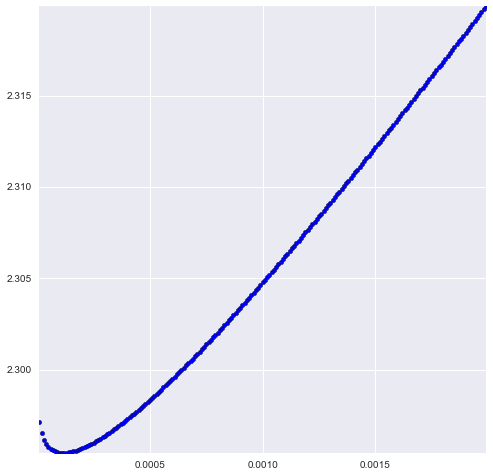

In [46]:
# Apply Laplacian smoothing to the result to reduce the log loss 
pred_probs2 = pred_probs.copy()
x = []
y = []
for s in range(1, 200):
    smoothing = s*(10**-5) 
    x.append(smoothing)
    t3 = np.add(pred_probs2 , (np.ones(pred_probs2.shape)*smoothing))
    ll = log_loss(mini_dev_labels, t3)
    y.append(ll)
    
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(111)
ax.set_xlim(min(x),max(x))
ax.set_ylim(min(y),max(y))
plt.scatter(x,y)
min_value = np.argmin(y)
smoothing_parameter = x[min_value]

print("We get the lowest log_loss score of: {0:f}, with smoothing parameter: {1:f}".
      format(y[min_value], x[min_value]))

In [47]:
# Warning: doing cross validation on large data set will be extremly time and memory consuming. It takes a computer
# with 16GB memory about 45-60 mins to run the cross validation model below. Carefully select the tunning parameters
# set before running.

n_estimators = [32, 64, 128, 160]
max_features = ['sqrt', 'log2', None]
max_depth = [10, 50, 100, 125, 150, None]
min_samples_split = [10, 50, 100, 200, 500]
# Note: Daghan is testing with class_weight as well

cv_clf = GridSearchCV(RandomForestClassifier(n_jobs=2), {'n_estimators': n_estimators, 
                                                 'max_features': max_features,
                                                 'max_depth': max_depth,
                                                 'min_samples_split': min_samples_split})

# The "optimal" parameters computed here may actually increase the submission score sometime, 
# probably due to overfitting.
cv_clf.fit(train_data[:50000][data_features], train_data[:50000]['Category_Num'])
print(cv_clf.best_params_)

{'min_samples_split': 50, 'n_estimators': 160, 'max_depth': 150, 'max_features': 'log2'}


/Users/PJ/anaconda/envs/python3/lib/python3.5/site-packages/sklearn/model_selection/_split.py:581: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of groups for any class cannot be less than n_splits=3.
  % (min_groups, self.n_splits)), Warning)


In [ ]:
# Divide data into train and dev data set and conduct cross-validation
# mini_train_data, mini_dev_data, mini_train_labels, mini_dev_labels = train_test_split(train_data[all_features], 
#                                                                                       train_data['Category_Num'], 
#                                                                                       test_size=0.5)

random_forest = RandomForestClassifier(max_depth=100, n_estimators=100, min_samples_split=50, max_features='log2', n_jobs=2)
random_forest.fit(mini_train_data, mini_train_labels)

pred_probs = random_forest.predict_proba(mini_dev_data)
pred_labels = random_forest.predict(mini_dev_data)

if mini_dev_labels.nunique() != pred_probs.shape[1]:
    print('Please run the cell again to get the multiclass loss.')
else:
    total_loss = log_loss(mini_dev_labels, pred_probs)
    print('The multiclass loss of Random Forest model is %.4f' % total_loss)
    
    rf_accuracy = np.mean(mini_dev_labels == pred_labels)
    print('The accuracy of Random Forest model is %.4f' % rf_accuracy)
    
    feature_weights = pd.DataFrame({'Feature': all_features, 'Weight': random_forest.feature_importances_})
    print(feature_weights.sort_values(by='Weight', ascending=False).reset_index(drop=True))

# Generate Submission Results

In [ ]:
# We will use the Random Forest to establish the baseline.
# Retrain the Random Forest model with full train data
random_forest = RandomForestClassifier(max_features=None, max_depth=50, n_estimators=50, min_samples_split=200)
random_forest.fit(train_data[data_features], train_data['Category_Num'])

In [ ]:
transformed_test_data = test_data[data_features]
transformed_test_data.info()

# Print which feature column contains NA value
print transformed_test_data.isnull().any()

# Fill the NA feature fields in the test data with the mean of that feature
transformed_test_data = transformed_test_data.fillna(transformed_test_data.mean())

predictions = random_forest.predict_proba(transformed_test_data)
print(predictions.shape)

In [ ]:
# Smooth the predictions
predictions = np.add(predictions , (np.ones(predictions.shape) * smoothing_parameter))

In [ ]:
# Generate the submission dataframe
submission = np.column_stack((range(predictions.shape[0]), predictions))
submission = pd.DataFrame(data=submission, columns=['Id'] + criminal_labels)
submission['Id'] = submission['Id'].astype(int)
submission.head()

In [ ]:
# Save the submission csv file
submission.to_csv('submission.csv.gz', index=False, compression='gzip')

# APPENDIX